# Image Processing with Python: Frequency Domain Filtering for Noise Reduction and Image Enhancement

## Introduction 

In contemporary times, image processing has become an indispensable part of our daily lives, spanning various domains such as social media and medical imaging. Notably, images acquired via digital cameras or other sources such as satellite photos and medical scans may necessitate pre-processing to eliminate or enhance noise. In this context, frequency domain filtering presents a viable solution by facilitating the elimination of noise while concurrently sharpening images.

Fast Fourier Transform (FFT), a mathematical technique utilized to transform images from their spatial domain to their frequency domain, is a pivotal tool for frequency transformation in image processing. By leveraging the frequency domain representation of an image, we can effectively analyze the image based on its frequency content, thus simplifying the application of filtering procedures to eliminate noise. The subsequent sections will discuss the various stages involved in the frequency transformation of images from FFT to inverse FFT, incorporating the use of FFT shift and inverse FFT shift.

This project utilized three Python libraries, namely openCV, Numpy, and Matplotlib, with the former employed to read the sample image provided below.

In [1]:
import cv2
import math
import numpy as np
from matplotlib import pyplot as plt

In [3]:
# Using 0 to read image in grayscale mode
img = cv2.imread('sample.png',0)
img

array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)

### Actual Image

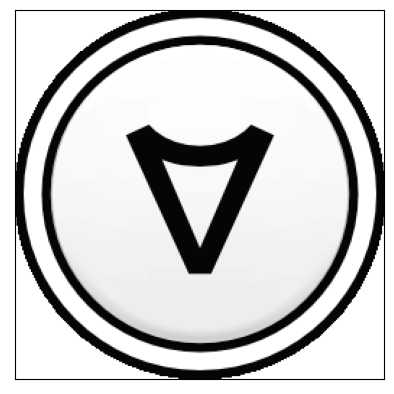

In [6]:
# Display the image in the notebook
plt.imshow(img, cmap='gray')  #cmap is used to specify imshow that the image is in greyscale
plt.xticks([]), plt.yticks([])  # remove tick marks
plt.show()

## Step 1: Fast Fourier Transform (FFT)

### FFT applied but unshift (Computing and visualizing the magnitude spectrum of an image using its Fourier transform)

The Fast Fourier Transform (FFT) is a widely utilized mathematical technique that allows for the conversion of images from their spatial domain into their frequency domain, serving as the fundamental component of frequency transformation. Employing FFT analysis, the periodicity of the image is meticulously analyzed and divided into distinct frequency components. Consequently, an image frequency spectrum is generated, exhibiting the amplitude and phase of each of the image’s respective frequency components.

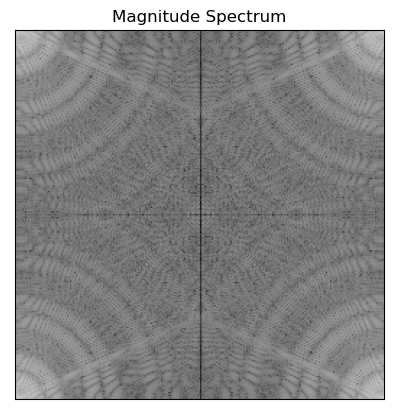

In [64]:
f = np.fft.fft2(img)  #the image img is passed to np.fft.fft2() to compute its Fourier transform f (2D FFT has applied)
mag = 20*np.log(np.abs(f))
# Create a figure and axes
fig, ax = plt.subplots()

# Display the magnitude spectrum
im = ax.imshow(mag, cmap='gray')
ax.set_title('Magnitude Spectrum')
ax.set_xticks([])
ax.set_yticks([])

# Save the image as a PNG file
fig.savefig('magnitude_spectrum.png', bbox_inches='tight')



The magnitude of the Fourier transform f is computed using np.abs(), 
and then converted to a logarithmic scale using np.log() and multiplied by 20 to get the magnitude in decibels. 
This is done to make the magnitude spectrum easier to visualize and interpret

## Step 2: FFT Shift

### FFT shift (Visualizing the magnitude spectrum of an image using the Fourier transform and FFT shift)

Subsequently, to enable the application of filtering algorithms to the image, the zero-frequency component of the image is shifted to the center of the frequency spectrum utilizing an FFT shift.

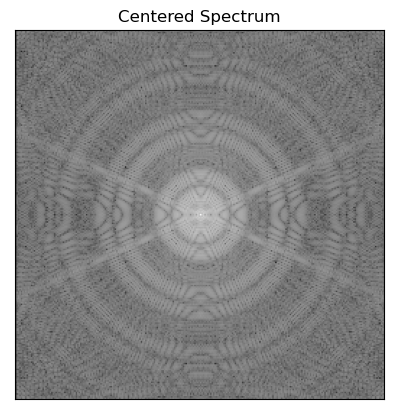

In [75]:
fftshifted_image = np.fft.fftshift(f)
mag = 20*np.log(np.abs(fftshifted_image)) 
# Create a figure and axes
fig, ax = plt.subplots()

# Display the Centered Spectrum
im = ax.imshow(mag, cmap='gray')
ax.set_title('Centered Spectrum')
ax.set_xticks([])
ax.set_yticks([])

# Save the image as a PNG file
fig.savefig('centered_spectrum.png', bbox_inches='tight')

## Step 3: Filtering

The initial stage of frequency transformation involves the use of various filtering algorithms to reduce noise and enhance image quality. The two most commonly employed filters for image sharpening are the Ideal high-pass filter and the Gaussian high-pass filter. These filters are applied to the frequency domain representation of the image obtained through the Fast Fourier Transform (FFT) method.

To create disk-shaped images for the Ideal and Gaussian filters, we use black (1) and white (0) pixels at the center and outside of the disk, respectively, for the Ideal high-pass filter. The Gaussian high-pass filter is constructed using the mathematical expression e^(-(distance from center)² / (2*(diameter size)²)) in the center and 1 — e^(-(distance from center)² / (2*(diameter size)²)) outside.

The Ideal filter, characterized by the equation |H(u, v)| = 1 if D(u, v) > D0 and |H(u, v)| = 0 if D(u, v) ≤ D0, has a sharp transition from low-pass to high-pass and removes all frequencies below a given cutoff frequency D0, while preserving frequencies above it. This filter can introduce ringing artifacts in the image, which are oscillations that appear near sharp edges in the image, resulting in an unnatural-looking image.

On the other hand, the Gaussian filter, with a transfer function given by H(u, v) = 1 — exp(-(D(u, v)²) / (2*(D⁰²))), attenuates frequencies according to a Gaussian distribution centered at the origin. This filter has a smooth transition from low-pass to high-pass and does not introduce ringing artifacts in the image. It is also more effective in reducing image noise as it has a more gradual cutoff than the Ideal filter.

### Function to Generate an Image of a Disk for Ideal High and Low pass filters with Desired Number of Pixels 

In [11]:
def distance(point1,point2):
    return math.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

### Function to Generate an Image of a Disk for Gaussian High and Low pass filters with Desired Number of Pixels 

In [28]:
def distance(point1,point2):
    return math.sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = math.exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - math.exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

### Sample Filters Generate

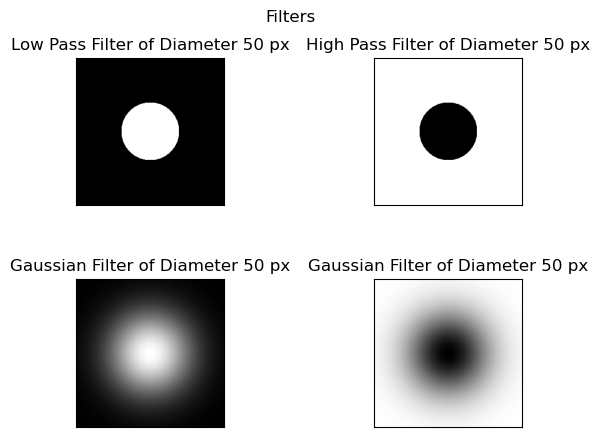

In [73]:
fig, ax = plt.subplots(2, 2) # create a 2x2 grid of subplots
fig.suptitle('Filters') # set the title for the entire figure

# plot the first image in the top-left subplot
im1 = ax[0, 0].imshow(np.abs(idealFilterLP(50, img.shape)), cmap='gray')
ax[0, 0].set_title('Low Pass Filter of Diameter 50 px')
ax[0, 0].set_xticks([])
ax[0, 0].set_yticks([])

# plot the second image in the top-right subplot
im2 = ax[0, 1].imshow(np.abs(idealFilterHP(50, img.shape)), cmap='gray')
ax[0, 1].set_title('High Pass Filter of Diameter 50 px')
ax[0, 1].set_xticks([])
ax[0, 1].set_yticks([])

# plot the third image in the bottom-left subplot
im3 = ax[1, 0].imshow(np.abs(gaussianLP(50 ,img.shape)), cmap='gray')
ax[1, 0].set_title('Gaussian Filter of Diameter 50 px')
ax[1, 0].set_xticks([])
ax[1, 0].set_yticks([])

# plot the fourth image in the bottom-right subplot
im4 = ax[1, 1].imshow(np.abs(gaussianHP(50 ,img.shape)), cmap='gray')
ax[1, 1].set_title('Gaussian Filter of Diameter 50 px')
ax[1, 1].set_xticks([])
ax[1, 1].set_yticks([])

# adjust the spacing between subplots
fig.subplots_adjust(wspace=0.5, hspace=0.5)

# save the figure to a file
fig.savefig('filters.png', bbox_inches='tight')


## Step 4: Multiplying Filter and Shifted Image to Get Filtered Image

To obtain the final filtered image with the desired frequency response, it is crucial to perform point-wise multiplication of the shifted image with the filter in the frequency domain.

This process multiplies corresponding pixels of the two images element by element. For instance, when applying the low pass filter, we will perform point-wise multiplication of the shifted Fourier transformed image with the low pass filter.

This operation suppresses high frequencies and preserves low frequencies, and vice versa for the high pass filter. This multiplication process is essential in removing undesired frequencies and enhancing the desired frequencies, resulting in a sharper and clearer image.

It enables us to achieve the desired frequency response and obtain the final filtered image in frequency domain.

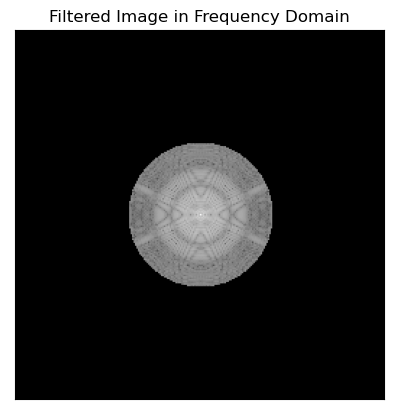

In [77]:
fig, ax = plt.subplots()
im = ax.imshow(np.log(1+np.abs(fftshifted_image * idealFilterLP(50,img.shape))), cmap='gray')
ax.set_title('Filtered Image in Frequency Domain')
ax.set_xticks([])
ax.set_yticks([])

fig.savefig('filtered image in freq domain.png', bbox_inches='tight')

The choice between using np.log(1+np.abs(x)) and 20*np.log(np.abs(x)) when visualizing the Fourier spectrum is a matter of personal preference and can depend on the specific application.

np.log(1+np.abs(x)) is commonly used because it helps to visualize the spectrum more clearly by compressing the dynamic range of the data. This is achieved by taking the logarithm of the absolute value of the data, and adding 1 to avoid taking the log of zero.

On the other hand, 20*np.log(np.abs(x)) scales the data by a factor of 20 and takes the logarithm of the absolute value of the data, which can make it easier to see smaller differences in magnitude between different frequencies. However, it does not compress the dynamic range of the data in the same way as np.log(1+np.abs(x)).

Both approaches have their advantages and disadvantages, and it ultimately comes down to the specific application and personal preference.

## Step 5: Inverse FFT Shift

After filtering the image in the frequency domain, we need to move it back to its original location before applying the inverse FFT. To achieve this, we use the inverse FFT shift, which reverses the shifting process performed earlier.

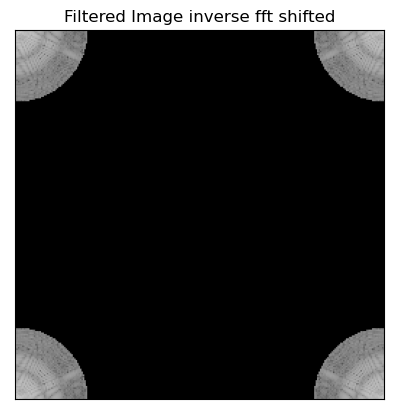

In [78]:
fig, ax = plt.subplots()
im = ax.imshow(np.log(1+np.abs(np.fft.ifftshift(fftshifted_image * idealFilterLP(50,img.shape)))), cmap='gray')
ax.set_title('Filtered Image inverse fft shifted')
ax.set_xticks([])
ax.set_yticks([])

fig.savefig('filtered image inverse fft shifted.png', bbox_inches='tight')

## Step 6: Inverse Fast Fourier Transform (IFFT)

The Inverse Fast Fourier Transform (IFFT) is the final step in the frequency transformation of images. It is used to transfer the image from the frequency domain back to the spatial domain. This step results in an image that has reduced noise and improved clarity compared to the original image in the spatial domain.

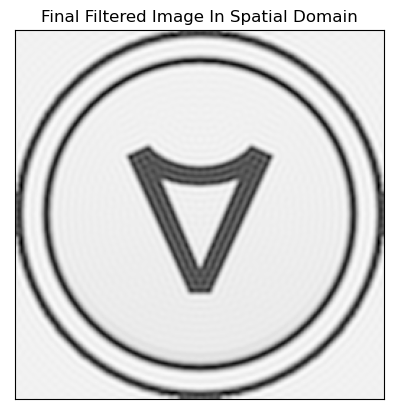

In [79]:
fig, ax = plt.subplots()
im = ax.imshow(np.log(1+np.abs(np.fft.ifft2(np.fft.ifftshift(fftshifted_image * idealFilterLP(50,img.shape))))), cmap='gray')
ax.set_title('Final Filtered Image In Spatial Domain')
ax.set_xticks([])
ax.set_yticks([])

fig.savefig('final filtered image.png', bbox_inches='tight')

## Combining all the steps to show all the Images and intermediate steps

### Function to Plot all the images

In [121]:
def Freq_Trans(image, filter_used):
    img_in_freq_domain = np.fft.fft2(image)

    # Shift the zero-frequency component to the center of the frequency spectrum
    centered = np.fft.fftshift(img_in_freq_domain)

    # Multiply the filter with the centered spectrum
    filtered_image_in_freq_domain = centered * filter_used

    # Shift the zero-frequency component back to the top-left corner of the frequency spectrum
    inverse_fftshift_on_filtered_image = np.fft.ifftshift(filtered_image_in_freq_domain)

    # Apply the inverse Fourier transform to obtain the final filtered image
    final_filtered_image = np.fft.ifft2(inverse_fftshift_on_filtered_image)

    return img_in_freq_domain,centered,filter_used,filtered_image_in_freq_domain,inverse_fftshift_on_filtered_image,final_filtered_image



For this project, selected diameters are 50, 100, and 150 pixels for both high-pass and low-pass Ideal and Gaussian filters individually, in order to showcase their impact on enhancing image sharpness.

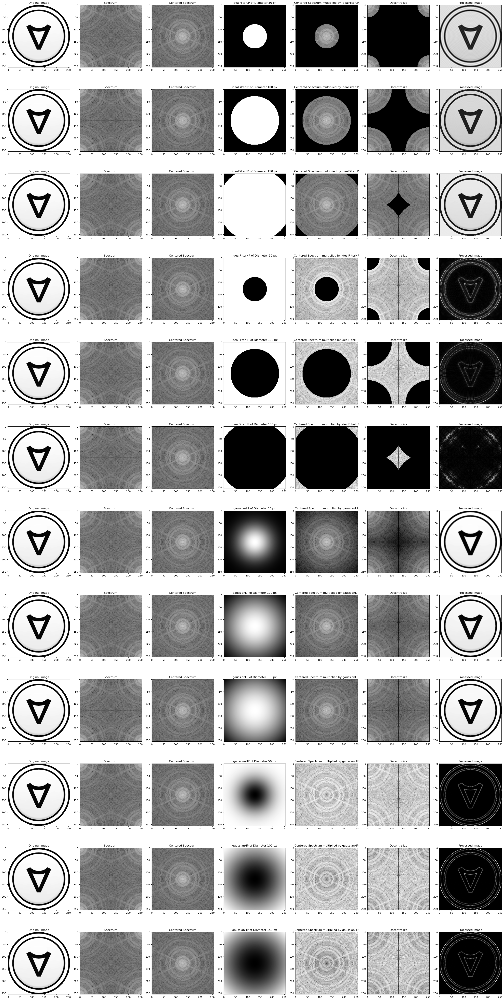

In [122]:
fig, axs = plt.subplots(12, 7, figsize=(30, 60))

filters = [(f, d) for f in [idealFilterLP, idealFilterHP, gaussianLP, gaussianHP] for d in [50, 100, 150]]

for row, (filter_name, filter_diameter) in enumerate(filters):
    # Plot each filter output on a separate subplot
    result = Freq_Trans(img, filter_name(filter_diameter, img.shape))

    for col, title, img_array in zip(range(7), 
    ["Original Image", "Spectrum", "Centered Spectrum", f"{filter_name.__name__} of Diameter {filter_diameter} px",
    f"Centered Spectrum multiplied by {filter_name.__name__}", "Decentralize", "Processed Image"],
    [img, np.log(1+np.abs(result[0])), np.log(1+np.abs(result[1])), np.abs(result[2]), np.log(1+np.abs(result[3])), 
     np.log(1+np.abs(result[4])), np.abs(result[5])]):
        
        axs[row, col].imshow(img_array, cmap='gray')
        axs[row, col].set_title(title)

plt.tight_layout()
plt.savefig('all_processess.png', bbox_inches='tight')
plt.show()


When varying the diameter of the disk-shaped filter images, the impact on image sharpness will differ. As the diameter of the filter increases, more frequencies are suppressed, resulting in a smoother image with less detail. Conversely, decreasing the diameter allows more frequencies to pass, resulting in a sharper image with more detail. It is important to select the appropriate diameter for the desired effect, as using too small a diameter can result in the filter not being effective enough, and using too large a diameter can result in too much detail being lost.

In general, Gaussian filters are more commonly used in image processing tasks due to their smoothness and robustness. However, in certain applications where a sharper cutoff is required, an Ideal filter may be more suitable. Ultimately, the choice of filter depends on the specific application and the desired outcome.

In summary, modifying image frequency using FFT is an efficacious approach to reduce noise and enhance image sharpness. This involves transforming the image to the frequency domain using FFT, filtering the noise using appropriate techniques, and converting the modified image back to the spatial domain using inverse FFT. By understanding and implementing these techniques, we can improve the quality of images for various applications.